In [10]:
from sentinelhub import SHConfig

In [11]:
config = SHConfig()
config

SHConfig(
  instance_id='',
  sh_client_id='',
  sh_client_secret='',
  sh_base_url='https://services.sentinel-hub.com',
  sh_auth_base_url=None,
  sh_token_url='https://services.sentinel-hub.com/oauth/token',
  geopedia_wms_url='https://service.geopedia.world',
  geopedia_rest_url='https://www.geopedia.world/rest',
  aws_access_key_id='',
  aws_secret_access_key='',
  aws_session_token='',
  aws_metadata_url='https://roda.sentinel-hub.com',
  aws_s3_l1c_bucket='sentinel-s2-l1c',
  aws_s3_l2a_bucket='sentinel-s2-l2a',
  opensearch_url='http://opensearch.sentinel-hub.com/resto/api/collections/Sentinel2',
  max_wfs_records_per_query=100,
  max_opensearch_records_per_query=500,
  max_download_attempts=4,
  download_sleep_time=5.0,
  download_timeout_seconds=120.0,
  number_of_download_processes=1,
)

In [13]:
import matplotlib.pyplot as plt
import numpy as np

def plot_image(image, factor=1.0, clip_range=(0, 1), save=False, save_path=None, dpi=300):
    """
    Plots an image with a given scaling factor and clipping range. Optionally saves the image.

    :param image: A numpy array of the image to plot
    :param factor: A float, the factor used to scale and adjust brightness of the image
    :param clip_range: A tuple, the range within which to clip the scaled image values
    :param save: A boolean, whether to save the image or not
    :param save_path: A string, the path (including filename) where to save the image
    :param dpi: An integer, the DPI of the saved image
    """
    # Scale and clip the image
    scaled_image = image * factor
    clipped_image = np.clip(scaled_image, clip_range[0], clip_range[1])
    
    # Plot the image
    plt.imshow(clipped_image)
    plt.axis('off')  # No axis for a cleaner look
    
    if save and save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight', pad_inches=0)
        print(f"Image saved as {save_path}")
    plt.show()

# Usage example:
# plot_image(image, factor=3.5 / 255, clip_range=(0, 1), save=True, save_path='/path/to/save/image.png')

In [14]:
import datetime
import os
import matplotlib.pyplot as plt
import numpy as np
from sentinelhub import (
    CRS,
    BBox,
    DataCollection,
    DownloadRequest,
    MimeType,
    MosaickingOrder,
    SentinelHubDownloadClient,
    SentinelHubRequest,
    bbox_to_dimensions,
)

In [15]:
# mapp box of our Satellite image (Carpathian Mountain)
# i took this coordinate on http://bboxfinder.com/

wg = (24.137650,48.021161,24.714432,48.270397)

In [16]:
resolution = 60
carpathian_bbox = BBox(bbox=wg, crs=CRS.WGS84)
carpathian_size = bbox_to_dimensions(carpathian_bbox, resolution=resolution)

print(f"Image shape at {resolution} m resolution: {carpathian_size} pixels")

Image shape at 60 m resolution: (730, 438) pixels


True color (PNG) on a specific date

In [17]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=("2016-06-01", "2020-06-30"),
            mosaicking_order=MosaickingOrder.LEAST_CC,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=carpathian_bbox,
    size=carpathian_size,
    config=config,
)

In [18]:
true_color_imgs = request_true_color.get_data()

In [19]:
print(f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}.")
print(f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}")

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (438, 730, 3)


Image type: uint8


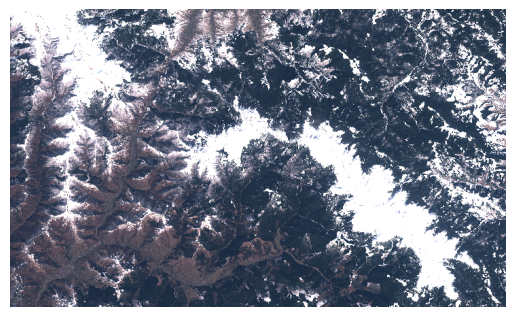

In [20]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5 / 255, clip_range=(0, 1))

In [21]:
evalscript_all_bands = """
    //VERSION=3
    function setup() {
        return {
            input: [{
                bands: ["B01","B02","B03","B04","B05","B06","B07","B08","B8A","B09","B10","B11","B12"],
                units: "DN"
            }],
            output: {
                bands: 13,
                sampleType: "INT16"
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B01,
                sample.B02,
                sample.B03,
                sample.B04,
                sample.B05,
                sample.B06,
                sample.B07,
                sample.B08,
                sample.B8A,
                sample.B09,
                sample.B10,
                sample.B11,
                sample.B12];
    }
"""

request_all_bands = SentinelHubRequest(
    evalscript=evalscript_all_bands,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=("2016-06-01", "2020-06-30"),
            mosaicking_order=MosaickingOrder.LEAST_CC,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    bbox=carpathian_bbox,
    size=carpathian_size,
    config=config,
)

In [22]:
all_bands_response = request_all_bands.get_data()

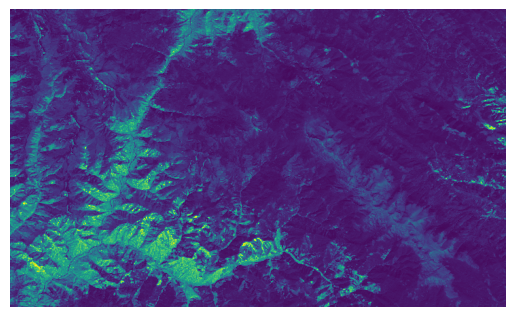

In [23]:
# Image showing the SWIR band B12
swir_b12 = all_bands_response[0][:, :, 12]
plot_image(swir_b12, factor=3.5 / 1e4)

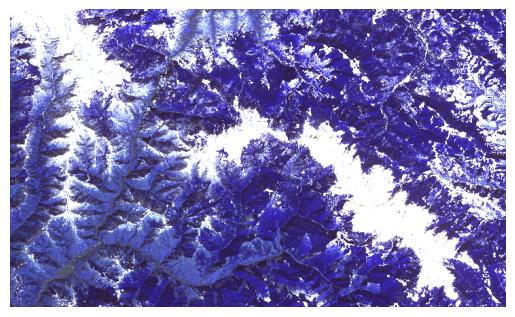

In [24]:
# From raw bands we can also construct a False-Color image
# False color image is (B03, B04, B08)
false_color = all_bands_response[0][:, :, [2, 3, 7]]
plot_image(false_color, factor=3.5 / 1e4, clip_range=(0, 1))

Image saved as images/colorinfrared.png


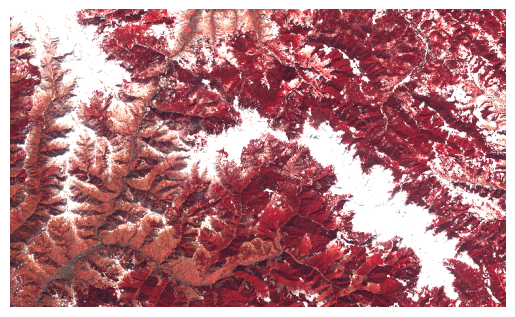

In [25]:
#Color Infrared (CIR) Image: (B08, B04, B03)
color_infrared = all_bands_response[0][:, :, [7, 3, 2]]
plot_image(color_infrared, factor=3.5 / 1e4,save=True, save_path="images/colorinfrared.png", clip_range=(0, 1))

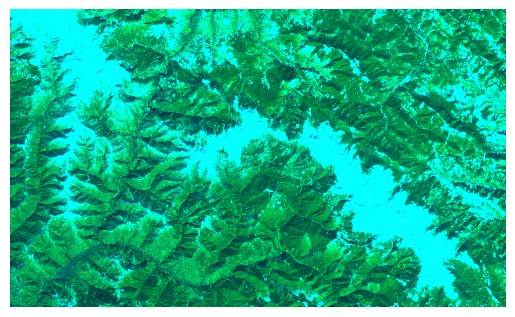

In [26]:
# Urban Area Detection: (B11, B08, B02)
urban_area = all_bands_response[0][:, :, [10, 7, 1]]
plot_image(urban_area, factor=3.5 / 1e4, clip_range=(0, 1))

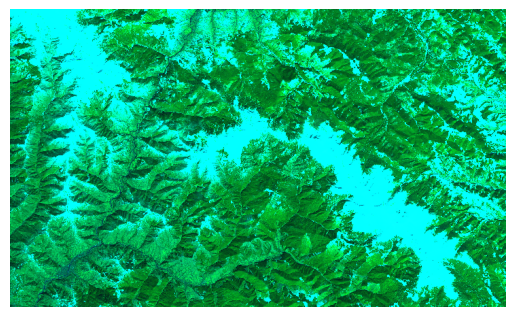

In [27]:
# Soil Moisture: (B11, B08, B04)
soil_moisture = all_bands_response[0][:, :, [10, 7, 3]]
plot_image(soil_moisture, factor=3.5 / 1e4, clip_range=(0, 1))

In [33]:
import datetime

start = datetime.datetime(2017, 1, 1)
end = datetime.datetime(2017, 12, 31)
n_chunks = 13
tdelta = (end - start) / n_chunks
edges = [(start + i * tdelta).date().isoformat() for i in range(n_chunks)]
slots = [(edges[i], edges[i + 1]) for i in range(len(edges) - 1)]

print("Monthly time windows:\n")
for slot in slots:
    print(slot)

Monthly time windows:

('2017-01-01', '2017-01-29')
('2017-01-29', '2017-02-26')
('2017-02-26', '2017-03-26')
('2017-03-26', '2017-04-23')
('2017-04-23', '2017-05-21')
('2017-05-21', '2017-06-18')
('2017-06-18', '2017-07-16')
('2017-07-16', '2017-08-13')
('2017-08-13', '2017-09-10')
('2017-09-10', '2017-10-08')
('2017-10-08', '2017-11-05')
('2017-11-05', '2017-12-03')


In [34]:
def get_true_color_request(time_interval):
    return SentinelHubRequest(
        evalscript=evalscript_true_color,
        input_data=[
            SentinelHubRequest.input_data(
                data_collection=DataCollection.SENTINEL2_L2A,
                time_interval=time_interval,
                mosaicking_order=MosaickingOrder.LEAST_CC,
            )
        ],
        responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
        bbox=carpathian_bbox,
        size=carpathian_size,
        config=config,
    )

In [35]:
# create a list of requests
list_of_requests = [get_true_color_request(slot) for slot in slots]
list_of_requests = [request.download_list[0] for request in list_of_requests]

# download data with multiple threads
data = SentinelHubDownloadClient(config=config).download(list_of_requests, max_threads=5)

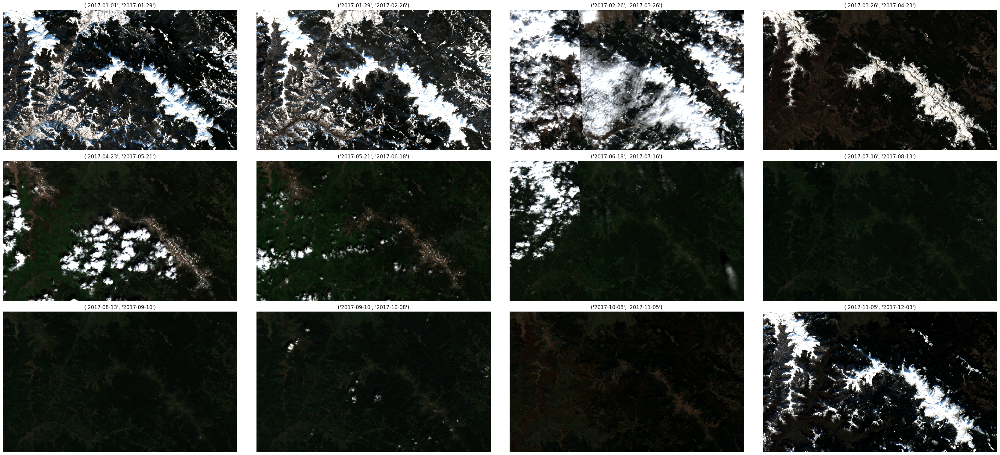

In [42]:
# some stuff for pretty plots
ncols = 4
nrows = 3
aspect_ratio = carpathian_size[0] / carpathian_size[1]

fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(5 * ncols * aspect_ratio, 5 * nrows))

for idx, image in enumerate(data):
    ax = axs[idx // ncols, idx % ncols]  # Determine the correct row and column
    ax.imshow(np.clip(image * 1.5 / 255, 0, 1))  # Adjust brightness and clip the image
    ax.set_title(f'{slots[idx]}')
    ax.axis('off')  # Turn off the axis

plt.tight_layout()
plt.show()  # Show the complete grid of images

['keypoints', 'scores', 'descriptors']


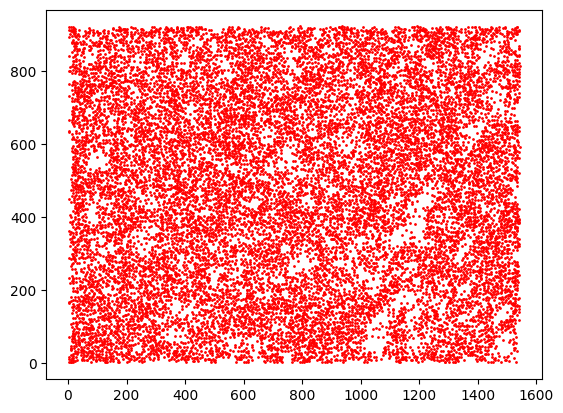

In [32]:
import numpy as np
import matplotlib.pyplot as plt
data = np.load('images/image_3.png.d2-net.npz')
# List all items
print(list(data.keys()))
from PIL import Image
# Access specific arrays
keypoints = data['keypoints']
scores = data['scores']
descriptors = data['descriptors']

# # Print or process these arrays
# print(keypoints)
# print(scores)
# print(descriptors)

image = Image.open('images/image_3.png')
#plt.imshow(image)
plt.scatter(keypoints[:, 0], keypoints[:, 1], c='red', s=1)  # Размер точек можно настроить
plt.show()